In [2]:
#group no 26
#Harshkumar Koringa 22ucs088
#Samyak Jain 22ucs147
#Bhavya Ameta 22ucs047

In [3]:
# Install necessary libraries if not already installed
!pip install tensorflow numpy matplotlib scikit-learn

# Import required libraries
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report


In [4]:
# Dataset directories
train_path = 'D:/DL/MY_data/train'          # Path to training data
validation_path = 'D:/DL/MY_data/test'      # Path to validation data
test_path = 'D:/DL/MY_data/predict'         # Path to the test folder with random images


In [5]:
# Create ImageDataGenerator instances for train, validation, and test sets
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# Load training data
train_data = train_datagen.flow_from_directory(
    train_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

# Load validation data
val_data = val_datagen.flow_from_directory(
    validation_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

#test data 

test_data = test_datagen.flow_from_directory(
    test_path,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    seed=42
)

# Load test data (predict folder)
#test_images = [os.path.join(test_path, fname) for fname in os.listdir(test_path) if fname.endswith(('.png', '.jpg', '.jpeg'))]

# Print class labels
print("Class labels (train):", train_data.class_indices)


Found 2301 images belonging to 10 classes.
Found 1025 images belonging to 10 classes.
Found 49 images belonging to 10 classes.
Class labels (train): {'apple': 0, 'avocado': 1, 'banana': 2, 'cherry': 3, 'kiwi': 4, 'mango': 5, 'orange': 6, 'pinenapple': 7, 'strawberries': 8, 'watermelon': 9}


In [6]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.applications import VGG16

# Use VGG16 as a base
vgg_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Add custom layers
model = Sequential([
    vgg_base,
    Flatten(),
    Dense(256, activation='relu'),
    BatchNormalization(),  # Add Batch Normalization
    Dropout(0.5),  # Add Dropout
    Dense(10, activation='softmax')  # Assuming 10 classes
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])


In [74]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=3, min_lr=1e-6)

# Train the model
history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=25,  # Increase epochs
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)


Epoch 1/25
72/72 [==============================] - 204s 3s/step - loss: 2.2567 - accuracy: 0.2760 - val_loss: 3.7451 - val_accuracy: 0.2341 - lr: 1.0000e-04
Epoch 2/25
72/72 [==============================] - 194s 3s/step - loss: 1.2890 - accuracy: 0.5645 - val_loss: 2.1430 - val_accuracy: 0.4254 - lr: 1.0000e-04
Epoch 3/25
72/72 [==============================] - 198s 3s/step - loss: 0.9203 - accuracy: 0.6945 - val_loss: 1.2585 - val_accuracy: 0.6605 - lr: 1.0000e-04
Epoch 4/25
72/72 [==============================] - 219s 3s/step - loss: 0.7620 - accuracy: 0.7362 - val_loss: 1.1167 - val_accuracy: 0.7200 - lr: 1.0000e-04
Epoch 5/25
72/72 [==============================] - 212s 3s/step - loss: 0.6219 - accuracy: 0.7953 - val_loss: 0.7532 - val_accuracy: 0.7844 - lr: 1.0000e-04
Epoch 6/25
72/72 [==============================] - 212s 3s/step - loss: 0.5211 - accuracy: 0.8214 - val_loss: 0.6462 - val_accuracy: 0.8185 - lr: 1.0000e-04
Epoch 7/25
72/72 [==============================] - 

In [75]:
def save_trained_model(model, save_path):
    """
    Saves the trained model to the specified path.

    :param model: Trained Keras model to save.
    :param save_path: Path to save the model (e.g., 'model_name.h5' or directory).
    """
    model.save(save_path)
    print(f"Model saved to {save_path}")


In [76]:
save_trained_model(model, "fruit_classifier2_model.h5")


Model saved to fruit_classifier_model.h5


In [8]:
from tensorflow.keras.models import load_model

def load_saved_model(model_path):
    """
    Loads a previously saved model from the specified path.

    :param model_path: Path to the saved model.
    :return: Loaded Keras model.
    """
    model = load_model(model_path)
    print(f"Model loaded from {model_path}")
    return model


In [9]:
model = load_saved_model("fruit_classifier_model.h5")


Model loaded from fruit_classifier_model.h5


In [10]:
# Evaluate the model on the validation set
val_loss, val_accuracy = model.evaluate(val_data, verbose=1)
print(f"Validation accuracy: {val_accuracy * 100:.2f}%")

# Plot training history
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.plot(history.history['accuracy'], label='Training Accuracy')

plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()



33/33 [==============================] - 29s 851ms/step - loss: 0.4497 - accuracy: 0.8985
Validation accuracy: 89.85%


NameError: name 'history' is not defined

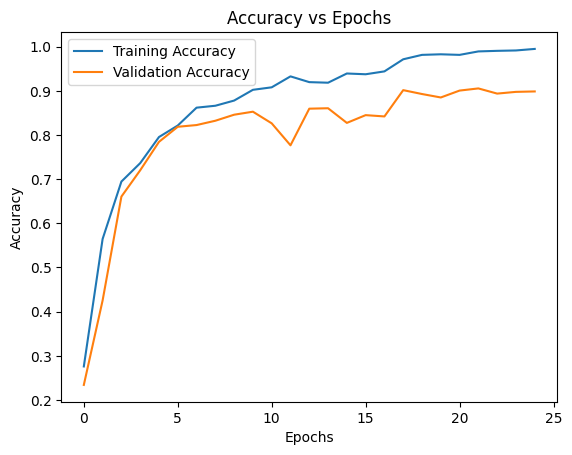

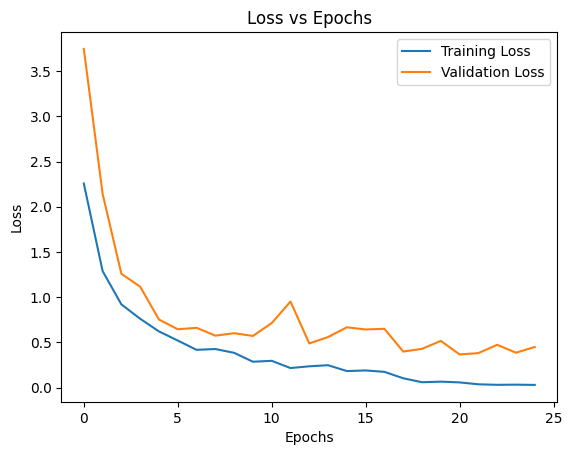

In [80]:
import matplotlib.pyplot as plt

# Plot accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss vs Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


2/2 [==============================] - 1s 314ms/step


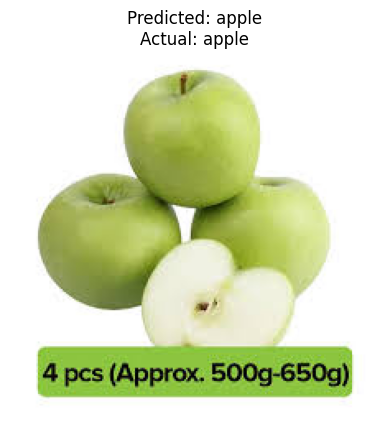

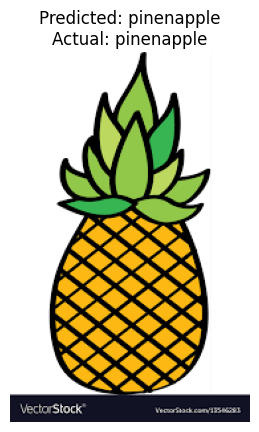

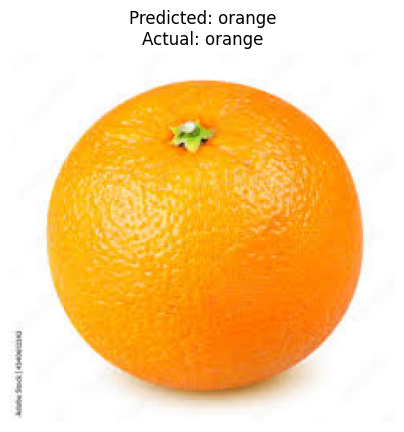

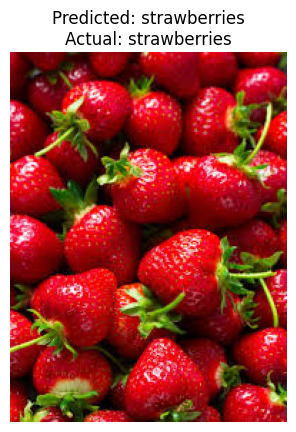

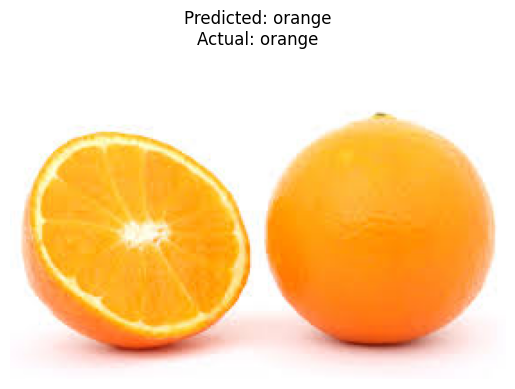

...

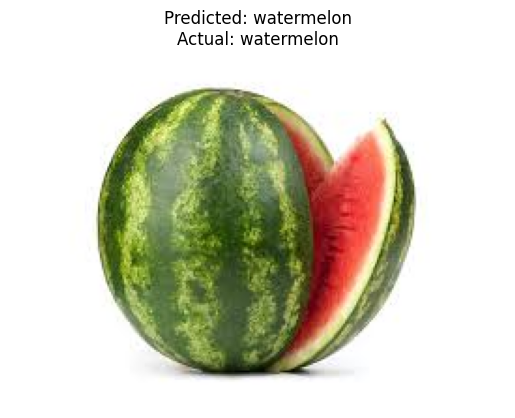

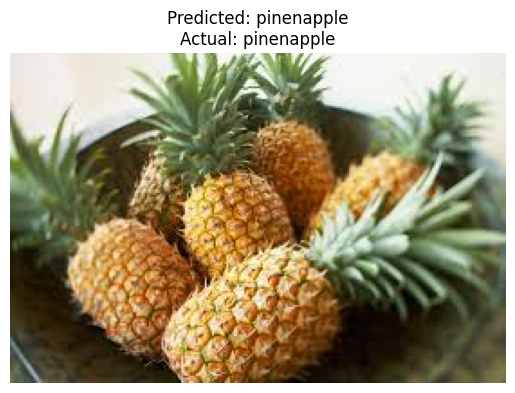

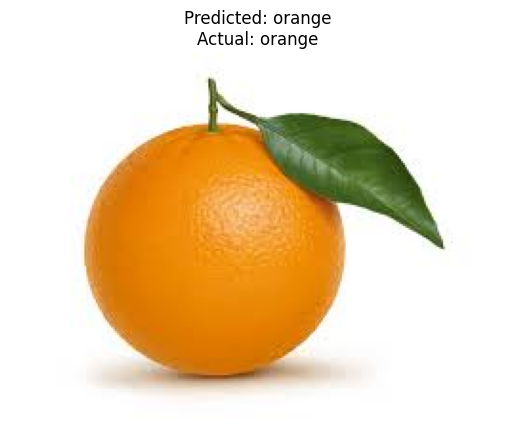

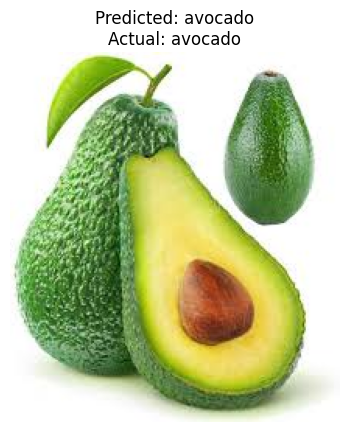

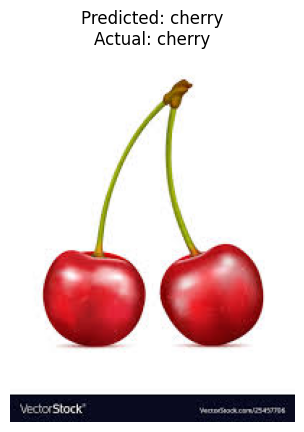

In [90]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.metrics import accuracy_score, classification_report

# Define the directory containing test images
test_directory = "D:/DL/MY_data/predict"

# Check if the directory exists
if not os.path.exists(test_directory):
    raise FileNotFoundError(f"Error: Directory {test_directory} does not exist.")

# Initialize lists for test images and labels
test_images = []
true_labels = []

# Collect all image paths and their actual labels from the test directory
for subdir in os.listdir(test_directory):
    subdir_path = os.path.join(test_directory, subdir)
    if os.path.isdir(subdir_path):
        for img_name in os.listdir(subdir_path):
            img_path = os.path.join(subdir_path, img_name)
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):  # Ensure valid image format
                test_images.append(img_path)
                true_labels.append(subdir)  # Folder name is the true label

# Shuffle the image paths and labels together
combined = list(zip(test_images, true_labels))
random.shuffle(combined)
test_images, true_labels = zip(*combined)

# Map class indices to labels
class_labels = {v: k for k, v in train_data.class_indices.items()}

# Prepare image data for prediction
img_size = (150, 150)  # Resize target
test_data = []

for img_path in test_images:
    img = load_img(img_path, target_size=img_size)
    img_array = img_to_array(img) / 255.0  # Normalize
    test_data.append(img_array)

test_data = np.array(test_data)  # Convert to numpy array

# Predict in batches
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = [class_labels[cls] for cls in predicted_classes]

# Display images with predicted and actual labels
for img_path, predicted_label, true_label in zip(test_images, predicted_labels, true_labels):
    img_display = mpimg.imread(img_path)
    plt.imshow(img_display)
    plt.title(f"Predicted: {predicted_label}\nActual: {true_label}")
    plt.axis('off')
    plt.show()




In [91]:
# Calculate accuracy
accuracy = accuracy_score(true_labels, predicted_labels)
print(f"Accuracy: {accuracy:.2f}")

# Generate a classification report
print("\nClassification Report:")
print(classification_report(true_labels, predicted_labels, zero_division=0))

Accuracy: 0.96

Classification Report:
              precision    recall  f1-score   support

       apple       1.00      0.80      0.89         5
     avocado       1.00      0.80      0.89         5
      banana       1.00      1.00      1.00         4
      cherry       1.00      1.00      1.00         5
        kiwi       0.86      1.00      0.92         6
       mango       0.83      1.00      0.91         5
      orange       1.00      1.00      1.00         4
  pinenapple       1.00      1.00      1.00         5
strawberries       1.00      1.00      1.00         5
  watermelon       1.00      1.00      1.00         5

    accuracy                           0.96        49
   macro avg       0.97      0.96      0.96        49
weighted avg       0.97      0.96      0.96        49



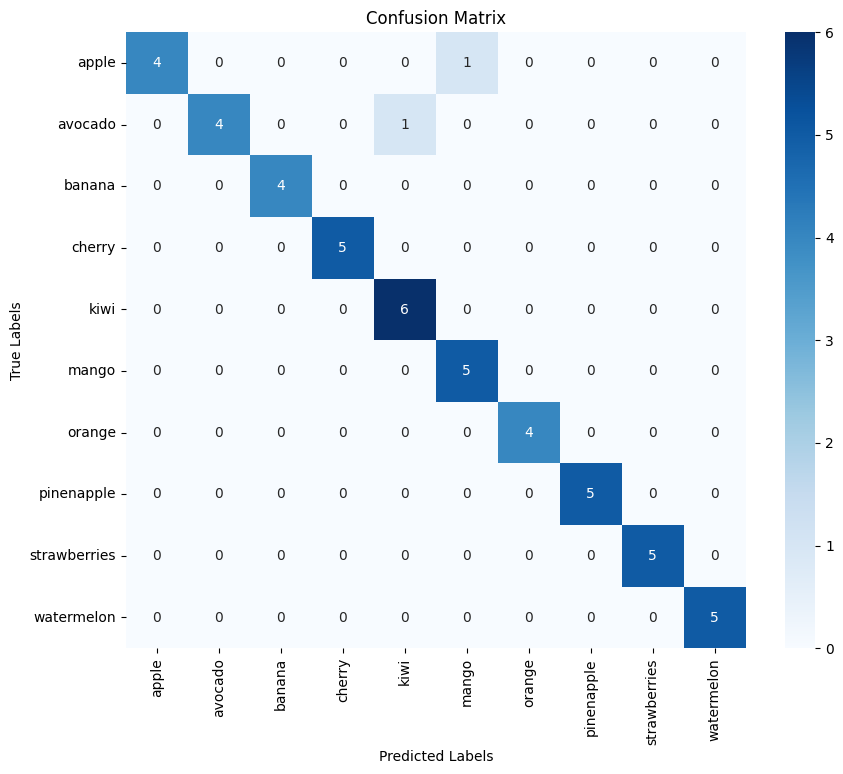

In [92]:
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels, labels=list(class_labels.values()))

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", 
            xticklabels=list(class_labels.values()), 
            yticklabels=list(class_labels.values()))
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()
